In [1]:
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs
import itertools
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from similarity_functions import read_data_from_csv

ImportError: cannot import name 'read_data_from_csv' from 'similarity_functions' (/Users/diliadis/Documents/python_projects/VIB/similarity_functions.py)

In [2]:
similarity_functions.read_data_from_csv('compounds.csv')

AttributeError: module 'similarity_functions' has no attribute 'read_data_from_csv'

In [34]:
# def read_data_from_csv(file_path):
#     """
#     Read SMILES strings and ChEMBL IDs from a CSV file.
    
#     Parameters:
#     file_path (str): The path to the CSV file.
    
#     Returns:
#     pd.DataFrame: A DataFrame containing the SMILES strings and ChEMBL IDs.
#     """
#     df = pd.read_csv(file_path)
#     return df

# def calculate_fingerprints(df, smiles_column='canonical_smiles'):
#     """
#     Calculate molecular fingerprints for SMILES strings and add them to the DataFrame.
    
#     Parameters:
#     df (pd.DataFrame): A DataFrame containing the SMILES strings and ChEMBL IDs.
#     smiles_column (str): The name of the column containing the SMILES strings. Default is 'canonical_smiles'.
    
#     Returns:
#     pd.DataFrame: The input DataFrame with additional columns for molecular fingerprints.
#     """
#     def fingerprint_from_smiles(smiles, smiles_column='canonical_smiles'):
#         return AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(smiles), 2, nBits=2048)

#     df['fingerprint'] = df['canonical_smiles'].apply(fingerprint_from_smiles)
#     return df

# def calculate_pairwise_similarities(df, similarity_function=DataStructs.TanimotoSimilarity):
#     """
#     Calculate pairwise similarities between molecular fingerprints.
    
#     Parameters:
#     df (pd.DataFrame): A DataFrame containing the molecular fingerprints.
#     similarity_function (function): A function that calculates the similarity between two fingerprints.
    
#     Returns:
#     list: A list of tuples where each tuple contains a pair of indices and their similarity score.
#     """
#     similarities = []
#     pairs = list(itertools.combinations(enumerate(df['fingerprint']), 2))
#     for (i, fp1), (j, fp2) in tqdm(pairs, desc="Calculating similarities"):
#         if fp1 is not None and fp2 is not None:
#             similarity = similarity_function(fp1, fp2)
#             similarities.append(((i, j), similarity))
#     return similarities

# def find_top_n_similarities(similarities, df, n=10):
#     """
#     Find the top N similarities and return the ChEMBL IDs along with similarity scores.
    
#     Parameters:
#     similarities (list): A list of tuples containing pairs of indices and their similarity scores.
#     df (pd.DataFrame): A DataFrame containing the SMILES strings and ChEMBL IDs.
#     n (int): The number of top similarities to return. Default is 10.
    
#     Returns:
#     list: A list of tuples where each tuple contains a pair of ChEMBL IDs and their similarity score.
#     """
#     similarities.sort(key=lambda x: x[1], reverse=True)
#     top_similarities = similarities[:n]
#     top_pairs_with_ids = [
#         ((df.iloc[pair[0]]['chembl_id'], df.iloc[pair[1]]['chembl_id']), similarity)
#         for pair, similarity in top_similarities
#     ]
#     return top_pairs_with_ids

In [5]:
# Path to the CSV file
file_path = 'compounds.csv'

# Step 1: Read SMILES strings from the CSV file
df = read_data_from_csv(file_path)

In [6]:
# Step 2: Calculate fingerprints for each SMILES string within the DataFrame
df = calculate_fingerprints(df)

In [7]:
# Step 3: Calculate pairwise similarities
similarities = calculate_pairwise_similarities(df)

Calculating similarities: 100%|██████████| 4498500/4498500 [00:12<00:00, 358626.79it/s]


In [10]:
# Step 4: Find the top 10 similarities
top_similarities = find_top_n_similarities(similarities, df, n=10)

In [11]:
top_similarities

[(('CHEMBL1185564', 'CHEMBL1180303'), 1.0),
 (('CHEMBL3211084', 'CHEMBL1219O'), 1.0),
 (('CHEMBL3659481', 'CHEMBL4115592'), 0.8703703703703703),
 (('CHEMBL1957077', 'CHEMBL1957074'), 0.8666666666666667),
 (('CHEMBL3263726', 'CHEMBL3263727'), 0.8620689655172413),
 (('CHEMBL3895991', 'CHEMBL3978459'), 0.8428571428571429),
 (('CHEMBL2177932', 'CHEMBL2177959'), 0.8378378378378378),
 (('CHEMBL1077552', 'CHEMBL2332107'), 0.8311688311688312),
 (('CHEMBL108931', 'CHEMBL432621'), 0.8305084745762712),
 (('CHEMBL3649850', 'CHEMBL3649871'), 0.797752808988764)]

In [38]:
# Print the results
for pair, similarity in top_similarities:
    print(f"{pair[0]} and {pair[1]}: Similarity = {similarity:.4f}")

CHEMBL1185564 and CHEMBL1180303: Similarity = 1.0000
CHEMBL3211084 and CHEMBL1219O: Similarity = 1.0000
CHEMBL3659481 and CHEMBL4115592: Similarity = 0.9307
CHEMBL1957077 and CHEMBL1957074: Similarity = 0.9286
CHEMBL3263726 and CHEMBL3263727: Similarity = 0.9259
CHEMBL3895991 and CHEMBL3978459: Similarity = 0.9147
CHEMBL2177932 and CHEMBL2177959: Similarity = 0.9118
CHEMBL1077552 and CHEMBL2332107: Similarity = 0.9078
CHEMBL108931 and CHEMBL432621: Similarity = 0.9074
CHEMBL3649850 and CHEMBL3649871: Similarity = 0.8875


# Random ideas

In [ ]:

# Function to calculate similarity matrix
def calculate_similarity_matrix(fingerprints):
    n = len(fingerprints)
    similarity_matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(i+1, n):
            if fingerprints[i] is not None and fingerprints[j] is not None:
                similarity = DataStructs.TanimotoSimilarity(fingerprints[i], fingerprints[j])
                similarity_matrix[i, j] = similarity
                similarity_matrix[j, i] = similarity
    return similarity_matrix

# Calculate similarity matrix
similarity_matrix = calculate_similarity_matrix(df['fingerprint'])

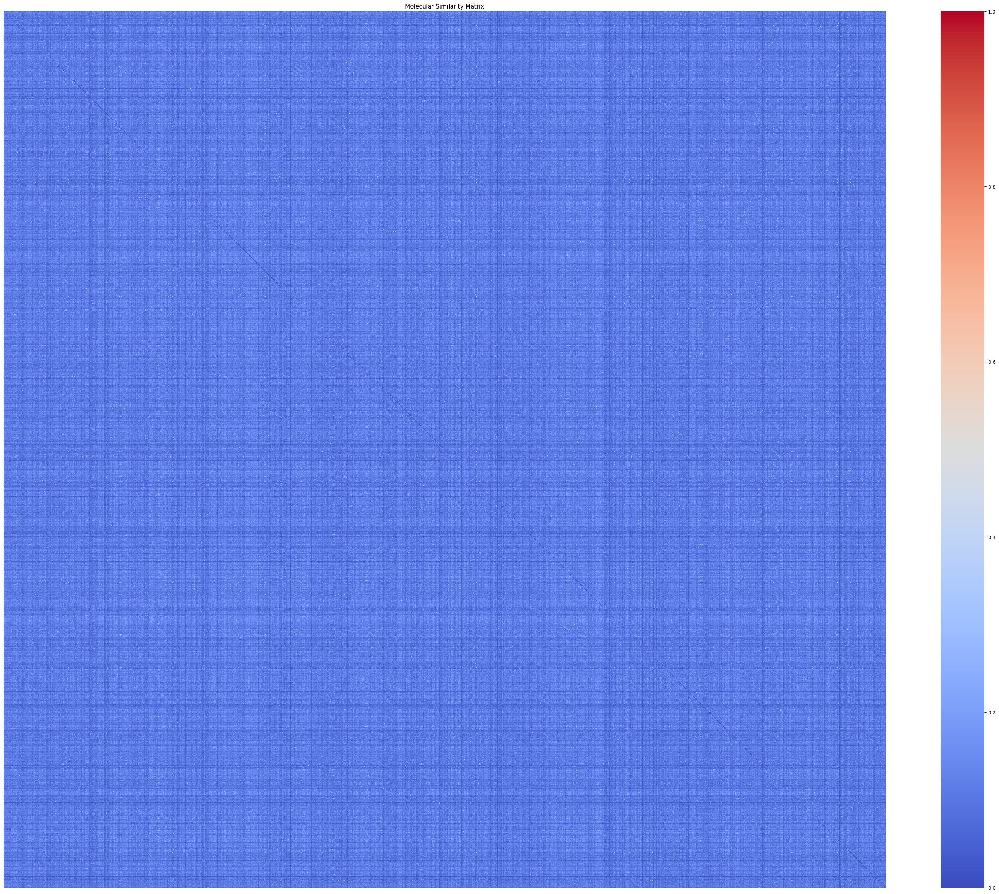

In [30]:
# Visualize similarity matrix
plt.figure(figsize=(40, 32))
sns.heatmap(similarity_matrix, cmap='coolwarm', xticklabels=False, yticklabels=False)
plt.title('Molecular Similarity Matrix')
plt.savefig('figures/similarity_matrix.png')
plt.show()